In [1]:
run_gridsearch = True,
skip_best_model_validation = False,
skip_best_model_test = False
verbose = False
GPU_SETTING = -1
NUM_ENSEMBLES = 5
hyperparam_csv_file = "hopland_mts2_hyperparams.csv"

In [2]:
hyperparam_space = {
    "hidden_size": [32, 64],
    "seq_length_1D": [90],
    "seq_length_1H": [168],
    "num_layers": [1],
    "epochs": [1],
    "batch_size": [64],
    "schedule_pairs": [
        ((0.5, 0.25), (0.01, 0.005, 0.001))
    ]
}

In [3]:
import sys
import os
import itertools
current_dir = os.getcwd()
print(current_dir)

c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all


In [4]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['..\\..\\..\\..\\UCB-USACE-LSTMs', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\python313.zip', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\DLLs', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\Lib', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project', '', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\Lib\\site-packages', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\Lib\\site-packages\\win32', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\Lib\\site-packages\\win32\\lib', 'c:\\Users\\arman\\anaconda3\\envs\\ucb-usace-project\\Lib\\site-packages\\Pythonwin']


In [5]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import (combinedPlot, fancyCombinedPlot, combinedPlotFromDf, fancyCombinedPlotFromDf, fractional_multi_lr)
from tqdm import tqdm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
# Dynamically find the repo root from the current working directory
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

# Construct the target path
target_path = os.path.join(library_path, 'UCB_training', 'models', 'hopland_all')

# Verify if the directory exists before changing
if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("hopland")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all
Train Basin File Exists: True


In [7]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("hopland_mtslstm2.yaml")
path_to_physics_data_1D = Path(library_path + "/russian_river_data/Hopland_daily_averaged.csv")
path_to_physics_data_1H = Path(library_path + "/russian_river_data/Hopland_hourly.csv")

In [8]:
features_with_physics = [
    #from daily.csv
    "RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 60 PRECIP-INC SCREENED",
    "RUSSIAN 70 PRECIP-INC SCREENED",
    "RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "WF RUSSIAN PRECIP-INC SCREENED",
    "WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    #from hopland.csv
    'Hopland Gage FLOW',
    'Russian 60 ET-POTENTIAL',
    'Russian 60 FLOW',
    'Russian 60 FLOW-BASE',
    'Russian 60 INFILTRATION',
    'Russian 60 PERC-SOIL',
    'Russian 60 SATURATION FRACTION',
    'Russian 70 ET-POTENTIAL',
    'Russian 70 FLOW',
    'Russian 70 FLOW-BASE',
    'Russian 70 INFILTRATION',
    'Russian 70 PERC-SOIL',
    'Russian 70 SATURATION FRACTION',
    'WF Russian ET-POTENTIAL',
    'WF Russian FLOW',
    'WF Russian FLOW-BASE',
    'WF Russian INFILTRATION',
    'WF Russian PERC-SOIL',
    'WF Russian SATURATION FRACTION',
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    "UKIAH CA FLOW USGS-MERGED",
    #"Lake Mendocino Storage",    
]


In [9]:
no_physics_results = []
physics_results = []

In [10]:
# starting time in UTC time
from datetime import datetime
start_time = datetime.utcnow()
print("Start time:", start_time.strftime("%Y-%m-%d %H:%M:%S"))

Start time: 2025-06-19 18:39:47


C:\Users\arman\AppData\Local\Temp\ipykernel_30528\2387850673.py:3: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  start_time = datetime.utcnow()


In [11]:
hyperparam_names = []
for i, hp in enumerate(hyperparam_space.keys()):
    hyperparam_names.append(hp)

total_iters = 1
for name in hyperparam_names:
    total_iters *= len(hyperparam_space[name])

if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for combinations in tqdm(
        itertools.product(*[hyperparam_space[hp] for hp in hyperparam_names]), 
        desc="Grid-Search", 
        total=total_iters, 
        unit="it", 
        ncols=60, 
        ascii=True):

        hp_run = {}
        j = 0
        while j < len(hyperparam_names):
            if hyperparam_names[j] != "seq_length_1D" or hyperparam_names[j] != "seq_length_1H":
                hp_run[hyperparam_names[j]] = combinations[j]
                j += 1
            else:
                hp_run["seq_length"] = {"1D": combinations[j], "1H": combinations[j + 1]}
                j += 2

        if verbose:
            print(f"\nNoPhysics: {hp_run}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp_run,
            input_features=None,
            physics_informed=False,
            physics_data_file=None,
            hourly=True,  
            extend_train_period=False,
            gpu=GPU_SETTING,
            is_mts = True,
            verbose=verbose,
        )
        trainer.train()
        csv_1d, metrics_1d = trainer.results(period="validation", mts_trk="1D")
        csv_1h, metrics_1h = trainer.results(period="validation", mts_trk="1H")
        
        row_data = {}
        j = 0
        while j < len(hyperparam_names):
            if hyperparam_names[j] == "learning_rate":
                row_data[hyperparam_names[j]] = str(combinations[j])
            else:
                row_data[hyperparam_names[j]] = combinations[j]
            j += 1
        for k, v in metrics_1d.items():
            row_data[k] = v
        for k, v in metrics_1h.items():
            row_data[k] = v
        
        no_physics_results.append(row_data)

    df_no_physics = pd.DataFrame(no_physics_results)
    df_no_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_no_physics.reset_index(drop=True, inplace=True)
else:
    print("Skipping grid search!")

Grid-Search: 100%|############| 2/2 [00:16<00:00,  8.05s/it]


In [12]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):    
    for combinations in tqdm(
        itertools.product(*[hyperparam_space[hp] for hp in hyperparam_names]), 
        desc="Grid-Search", 
        total=total_iters, 
        unit="it", ncols=60, 
        ascii=True):

        if "schedule_pairs" in hyperparam_names:
            (f1, f2), (lr1, lr2, lr3) = combinations[hyperparam_names.index("schedule_pairs")]

            fractions = [f1, f2]
            lr_list = [lr1, lr2, lr3]


            lr_dict = fractional_multi_lr(
                epochs=combinations[hyperparam_names.index("epochs")],
                fractions=fractions,
                lrs=lr_list,
                round_up=True)


        hp_run = {}
        j = 0
        while j < len(hyperparam_names):
            if hyperparam_names[j] != "seq_length_1D" or hyperparam_names[j] != "seq_length_1H":
                hp_run[hyperparam_names[j]] = combinations[j]
                j += 1
            else:
                hp_run["seq_length"] = {"1D": combinations[j], "1H": combinations[j + 1]}
                j += 2
        if verbose:
            print(f"\nPhysics: {hp_run}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp_run,
            input_features=features_with_physics,
            physics_informed=True,
            physics_data_file=path_to_physics_data_1H,
            hourly=True,
            extend_train_period=False,
            gpu=GPU_SETTING,
            is_mts = True,
            verbose=verbose,
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()

        row_data = {}
        j = 0
        while j < len(hyperparam_names):
            if hyperparam_names[j] == "learning_rate":
                row_data[hyperparam_names[j]] = str(combinations[j])
            else:
                row_data[hyperparam_names[j]] = combinations[j]
            j += 1

        for k, v in metrics_dict.items():
            row_data[k] = v
        physics_results.append(row_data)
    df_physics = pd.DataFrame(physics_results)
    df_physics.sort_values(by="NSE", ascending=False, inplace=True)
    df_physics.reset_index(drop=True, inplace=True)
    best_no_phys = df_no_physics.iloc[0].to_dict()
    best_phys = df_physics.iloc[0].to_dict()
    best_no_phys["model_type"] = "no_physics"
    best_phys["model_type"] = "physics"
    best_params_df = pd.DataFrame([best_no_phys, best_phys])
    best_params_df.to_csv(hyperparam_csv_file, index=False)
else:
    print("Skipping grid search!")

Grid-Search: 100%|############| 2/2 [00:20<00:00, 10.21s/it]


In [13]:
if run_gridsearch:
    print(df_no_physics.iloc[0:4])
    df_no_physics.to_csv("hopland_mts2_no_physics_gridsearch.csv", index=False)

   hidden_size  seq_length_1D  seq_length_1H  num_layers  epochs  batch_size  \
0           64             90            168           1       1          64   
1           32             90            168           1       1          64   

                        schedule_pairs       NSE          MSE        RMSE  \
0  ((0.5, 0.25), (0.01, 0.005, 0.001))  0.675987  700817.6250  837.148508   
1  ((0.5, 0.25), (0.01, 0.005, 0.001))  0.628933  802593.5625  895.875863   

        KGE  Alpha-NSE  Beta-KGE  Beta-NSE  Pearson-r        FHV        FMS  \
0  0.659204   0.703556  0.989582 -0.005346   0.832207 -35.709755 -45.975075   
1  0.605101   0.688959  0.854538 -0.074648   0.804961 -42.147030 -12.084572   

        FLV  Peak-Timing  Peak-MAPE  
0 -4.274827          NaN  46.601891  
1  4.035836          NaN  54.449219  


In [14]:
if run_gridsearch:
    print(df_physics.iloc[0:4])
    df_physics.to_csv("hopland_mts2_physics_gridsearch.csv", index=False)

   hidden_size  seq_length_1D  seq_length_1H  num_layers  epochs  batch_size  \
0           64             90            168           1       1          64   
1           32             90            168           1       1          64   

                        schedule_pairs       NSE          MSE        RMSE  \
0  ((0.5, 0.25), (0.01, 0.005, 0.001))  0.800572  431349.8125  656.772268   
1  ((0.5, 0.25), (0.01, 0.005, 0.001))  0.737843  567028.7500  753.013114   

        KGE  Alpha-NSE  Beta-KGE  Beta-NSE  Pearson-r        FHV        FMS  \
0  0.774285   0.856102  1.141341  0.072533   0.898692 -18.660133 -10.772874   
1  0.727922   0.764453  0.983137 -0.008654   0.864871 -35.897419  -2.011037   

        FLV  Peak-Timing  Peak-MAPE  
0 -0.936018          NaN  35.131111  
1  2.036028          NaN  38.768883  


In [15]:
if os.path.exists(hyperparam_csv_file):
    best_params_df = pd.read_csv(hyperparam_csv_file)
    best_no_phys = best_params_df.query("model_type == 'no_physics'").iloc[0].to_dict()
    best_phys = best_params_df.query("model_type == 'physics'").iloc[0].to_dict()


    best_no_physics_params = {}
    j = 0
    while j < len(hyperparam_names):
        if hyperparam_names[j] == "output_dropout":
            best_no_physics_params[hyperparam_names[j]] = float(best_no_phys[hyperparam_names[j]])
            j += 1
        elif hyperparam_names[j] == "learning_rate":
            best_no_physics_params[hyperparam_names[j]] = eval(str(best_no_phys[hyperparam_names[j]]))
            j += 1
        elif hyperparam_names[j] == "seq_length_1D" or hyperparam_names[j] == "seq_length_1H":
            best_no_physics_params["seq_length"] = {"1D": int(best_no_phys[hyperparam_names[j]]), "1H": int(best_no_phys[hyperparam_names[j + 1]])}
            j += 2
        elif hyperparam_names[j] == "schedule_pairs":
            j += 1
            continue
        else:
            best_no_physics_params[hyperparam_names[j]] = int(best_no_phys[hyperparam_names[j]])
            j += 1
    
    best_physics_params = {}
    j = 0
    while j < len(hyperparam_names):
        if hyperparam_names[j] == "output_dropout":
            best_physics_params[hyperparam_names[j]] = float(best_phys[hyperparam_names[j]])
            j += 1
        elif hyperparam_names[j] == "learning_rate":
            best_physics_params[hyperparam_names[j]] = eval(str(best_phys[hyperparam_names[j]]))
            j += 1
        elif hyperparam_names[j] == "seq_length_1D" or hyperparam_names[j] == "seq_length_1H":
            best_physics_params["seq_length"] = {"1D": int(best_phys[hyperparam_names[j]]), "1H": int(best_phys[hyperparam_names[j + 1]])}
            j += 2
        elif hyperparam_names[j] == "schedule_pairs":
            j += 1
            continue
        else:
            best_physics_params[hyperparam_names[j]] = int(best_phys[hyperparam_names[j]])
            j += 1

    print("Loaded best hyperparams from CSV:")
    print("Best NO-PHYS:", best_no_physics_params)
    print("Best PHYS:", best_physics_params)
else:
    print(f"Error: {hyperparam_csv_file} not found. Did you run gridsearch?")

Loaded best hyperparams from CSV:
Best NO-PHYS: {'hidden_size': 64, 'seq_length': {'1D': 90, '1H': 168}, 'num_layers': 1, 'epochs': 1, 'batch_size': 64}
Best PHYS: {'hidden_size': 64, 'seq_length': {'1D': 90, '1H': 168}, 'num_layers': 1, 'epochs': 1, 'batch_size': 64}


In [16]:
if not skip_best_model_validation:
    noPhysValTrainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=True,
        extend_train_period=False,
        gpu=GPU_SETTING,
        is_mts = True
    )
    noPhysValTrainer.train()
    noPhys_val_csv_1D, noPhys_val_metrics_1D = noPhysValTrainer.results(period="validation", mts_trk="1D")
    noPhys_val_csv_1H, noPhys_val_metrics_1H = noPhysValTrainer.results(period="validation", mts_trk="1H")
    print("NO-PHYS VAL 1D => NSE =", noPhys_val_metrics_1D.get("NSE", None))
    print("NO-PHYS VAL 1H => NSE =", noPhys_val_metrics_1H.get("NSE", None))

In [17]:
if not skip_best_model_validation:
    physValTrainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data_1H,
        hourly=True,
        extend_train_period=False,
        gpu=GPU_SETTING,
        is_mts = True
    )
    physValTrainer.train()
    phys_val_csv_1D, phys_val_metrics_1D = physValTrainer.results(period="validation", mts_trk="1D")
    phys_val_csv_1H, phys_val_metrics_1H = physValTrainer.results(period="validation", mts_trk="1H")
    print("PHYS VAL 1D => NSE =", phys_val_metrics_1D.get("NSE", None))
    print("PHYS VAL 1H => NSE =", phys_val_metrics_1H.get("NSE", None))

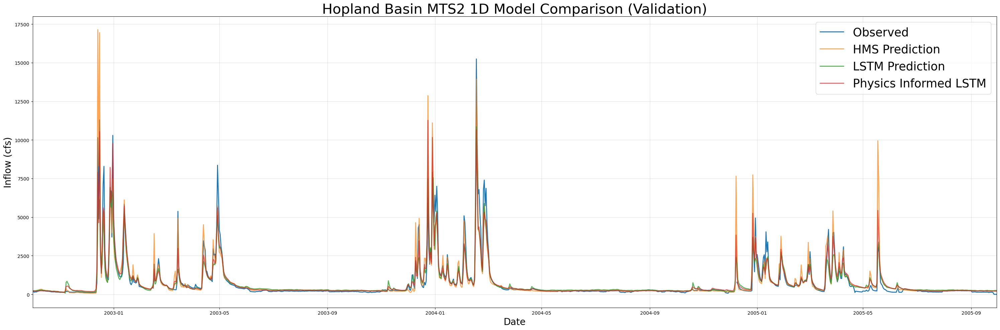

In [18]:
if not skip_best_model_validation:
    print("\nPlotting combined MTS results (Validation, 1D)...")
    combinedPlot(
        lstm_results=noPhys_val_csv_1D,
        lstmPhysics_results=phys_val_csv_1D,
        HMS_results=path_to_physics_data_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1D.csv",
        plot_filename="hopland_mts2_val_1D_comparison.png",
        timeseries_filename="hopland_mts2_val_1D_combined_ts.csv"
    )
else:
    combined_df_1D = pd.read_csv("hopland_mts2_val_1D_combined_ts.csv")
    combinedPlotFromDf(
        combined_df_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1D.csv"
    )

In [19]:
if not skip_best_model_validation:
    fancyCombinedPlot(
        lstm_results=noPhys_val_csv_1D,
        lstmPhysics_results=phys_val_csv_1D,
        HMS_results=path_to_physics_data_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1D.csv",
        timeseries_filename="hopland_mts2_val_1D_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(
        combined_df_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1D.csv"
    )

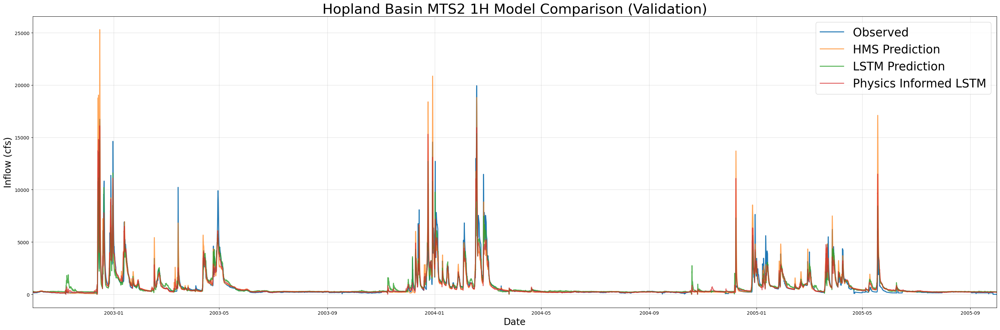

In [20]:
if not skip_best_model_validation:
    print("\nPlotting combined MTS results (Validation, 1H)...")
    combinedPlot(
        lstm_results=noPhys_val_csv_1H,
        lstmPhysics_results=phys_val_csv_1H,
        HMS_results=path_to_physics_data_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1H.csv",
        plot_filename="hopland_mts2_val_1H_comparison.png",
        timeseries_filename="hopland_mts2_val_1H_combined_ts.csv"
    )
else:
    combined_df_1H = pd.read_csv("hopland_mts2_val_1H_combined_ts.csv")
    combinedPlotFromDf(
        combined_df_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1H.csv"
    )

In [21]:
if not skip_best_model_validation:
    fancyCombinedPlot(
        lstm_results=noPhys_val_csv_1H,
        lstmPhysics_results=phys_val_csv_1H,
        HMS_results=path_to_physics_data_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1H.csv",
        timeseries_filename="hopland_mts2_val_1H_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(
        combined_df_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Validation)",
        fName="hopland_mts2_val_metrics_1H.csv"
    )

In [22]:
if skip_best_model_validation:
    val_metrics = pd.read_csv("hopland_mts2_val_metrics_1D.csv")
    print(val_metrics)

     Unnamed: 0            HMS           LSTM  Physics_Informed_LSTM
0           NSE       0.794203       0.841867               0.887857
1           MSE  394832.064406  303385.823199          215151.545626
2          RMSE     628.356638     550.804705             463.844312
3           KGE       0.874059       0.736247               0.851416
4     Alpha-NSE       1.062471       0.745366               0.861932
5      Beta-KGE       1.054872       0.971165               1.010054
6      Beta-NSE       0.029892      -0.015708               0.005477
7     Pearson-r       0.905409       0.937583               0.946022
8           FHV       7.260398     -24.134524             -12.840064
9           FMS      -5.964464     -10.899849              -1.866337
10          FLV      94.259460      93.654958              97.079398
11  Peak-Timing       0.000000       0.400000               0.000000
12    Peak-MAPE      24.046090      40.623594              23.849625
13        PBIAS      -5.487217    

In [23]:
if skip_best_model_validation:
    val_metrics = pd.read_csv("hopland_mts2_val_metrics_1H.csv")
    print(val_metrics)

     Unnamed: 0            HMS           LSTM  Physics_Informed_LSTM
0           NSE       0.758403       0.839048               0.853795
1           MSE  522557.216232  348128.282297          316230.826080
2          RMSE     722.881191     590.023968             562.344046
3           KGE       0.859804       0.758326               0.859856
4     Alpha-NSE       1.066691       0.769292               0.881595
5      Beta-KGE       1.054137       1.016866               1.000112
6      Beta-NSE       0.027782       0.008655               0.000057
7     Pearson-r       0.889201       0.930032               0.925031
8           FHV       5.298288     -26.204239             -14.004350
9           FMS      -8.691652      -6.242736              -2.359967
10          FLV      94.133933      -3.598594              -2.486591
11  Peak-Timing            NaN            NaN                    NaN
12    Peak-MAPE      37.068683      34.323425              36.171044
13        PBIAS      -5.413689    

# Test Period


Training No-Physics MTS2 model for test period...
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-06-19 11:40:27,660: Logging to c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1906_114027\output.log initialized.
2025-06-19 11:40:27,662: ### Folder structure created at c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1906_114027
2025-06-19 11:40:27,663: ### Run configurations for testing_run
2025-06-19 11:40:27,664: experiment_name: testing_run
2025-06-19 11:40:27,666: train_basin_file: hopland
2025-06-19 11:40:27,667: validation_basin_file: hopland
2025-06-19 11:40:27,668: test_basin_file: hopland
2025-06-19 11:40:27,669: train_start_date: 1994-10-01 00:00:00
2025-06-19 11:40:27,671: train_end_date: 2005-09-30 00:00:00
2025-06-19 11:40:27,672: validation_start_date: 2002-10-01 00:00:00
2025-06-19 11:40:27,673: validation_end_date: 2005-09-30 00:00:00
2025-06

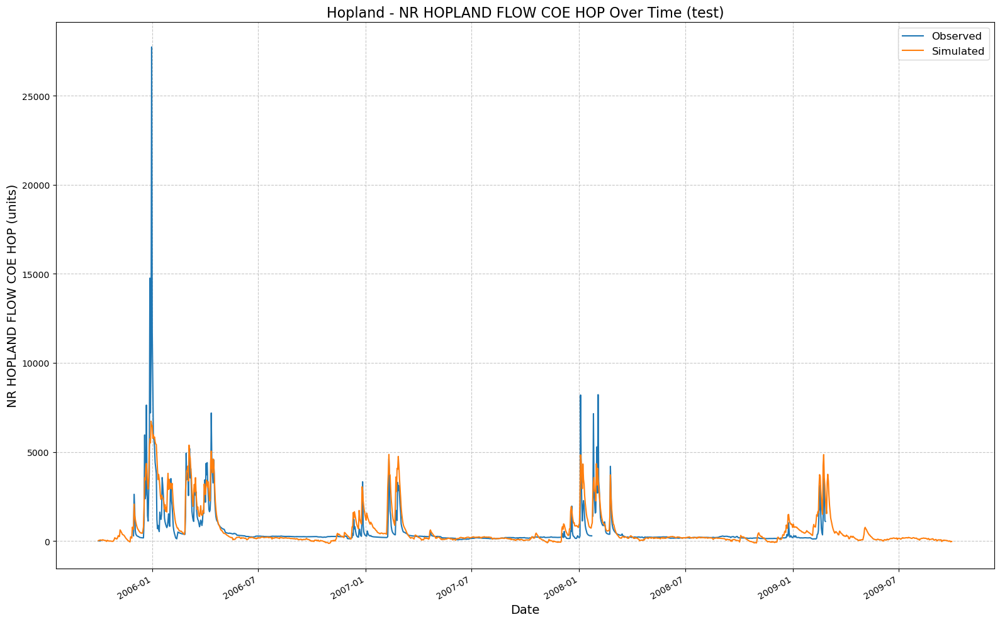

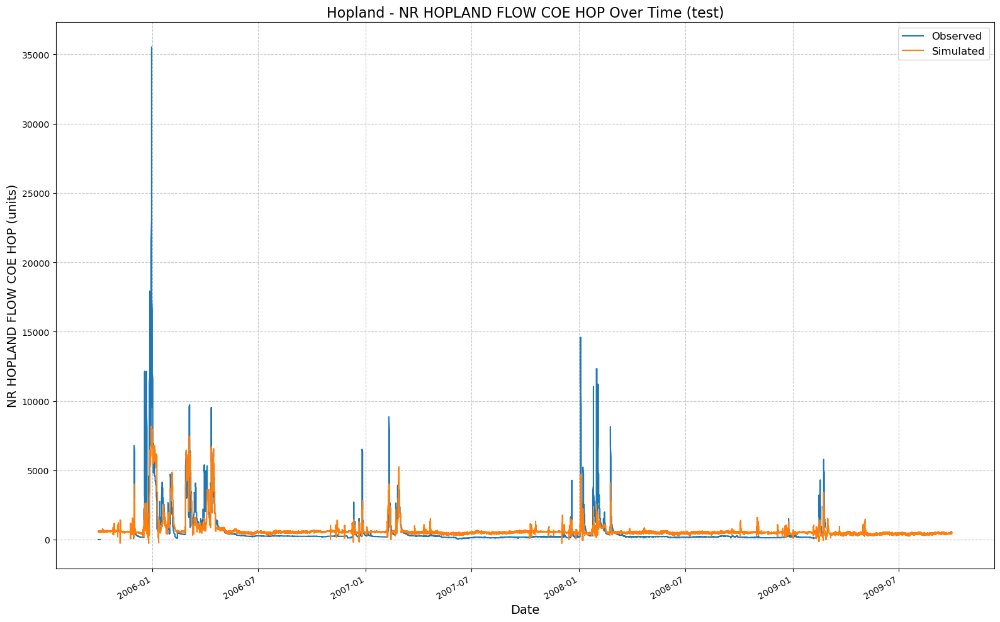


[No-Physics Test] NSE @1D = 0.573168158531189
[No-Physics Test] NSE @1H = 0.5401287078857422


In [24]:
if not skip_best_model_test:
    print("\nTraining No-Physics MTS2 model for test period...")
    mtsNoPhysicsTest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=True,
        extend_train_period=True,
        gpu=GPU_SETTING,
        # num_ensemble_members=NUM_ENSEMBLES,
        is_mts = True
    )
    mtsNoPhysicsTest.train()
    no_physics_test_csv_1D, no_physics_test_metrics_1D = mtsNoPhysicsTest.results(period="test", mts_trk="1D")
    no_physics_test_csv_1H, no_physics_test_metrics_1H = mtsNoPhysicsTest.results(period="test", mts_trk="1H")
    print("\n[No-Physics Test] NSE @1D =", no_physics_test_metrics_1D.get("NSE", None))
    print("[No-Physics Test] NSE @1H =", no_physics_test_metrics_1H.get("NSE", None))


Training Physics MTS model for test period...
[UCB Trainer] Using CPU (unhandled gpu=-1).
2025-06-19 11:40:40,018: Logging to c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1906_114040\output.log initialized.
2025-06-19 11:40:40,019: ### Folder structure created at c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\runs\testing_run_1906_114040
2025-06-19 11:40:40,020: ### Run configurations for testing_run
2025-06-19 11:40:40,020: experiment_name: testing_run
2025-06-19 11:40:40,021: train_basin_file: hopland
2025-06-19 11:40:40,021: validation_basin_file: hopland
2025-06-19 11:40:40,022: test_basin_file: hopland
2025-06-19 11:40:40,023: train_start_date: 1994-10-01 00:00:00
2025-06-19 11:40:40,024: train_end_date: 2005-09-30 00:00:00
2025-06-19 11:40:40,024: validation_start_date: 2002-10-01 00:00:00
2025-06-19 11:40:40,025: validation_end_date: 2005-09-30 00:00:00
2025-06-19 

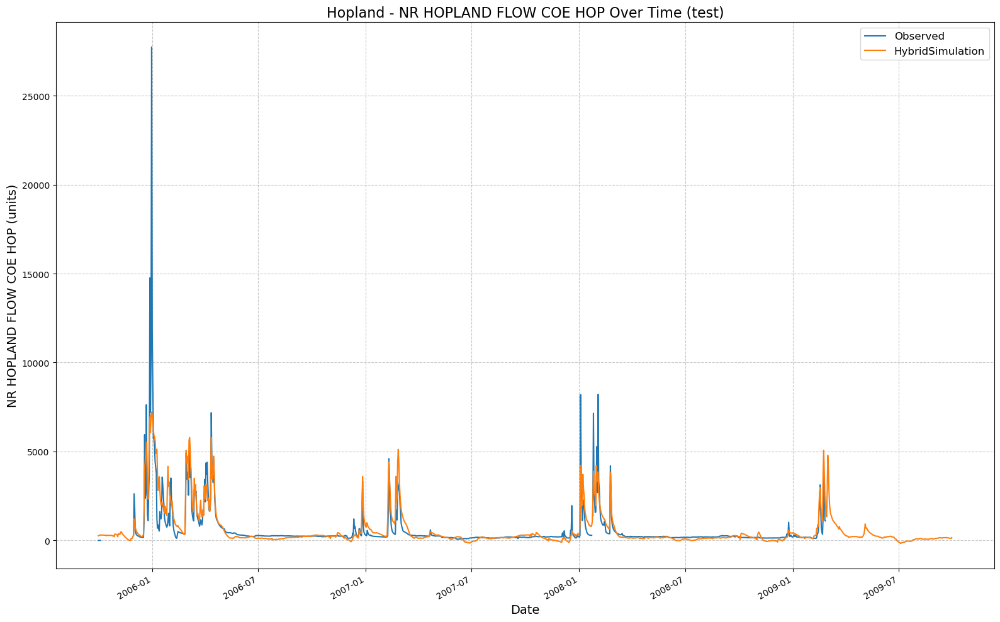

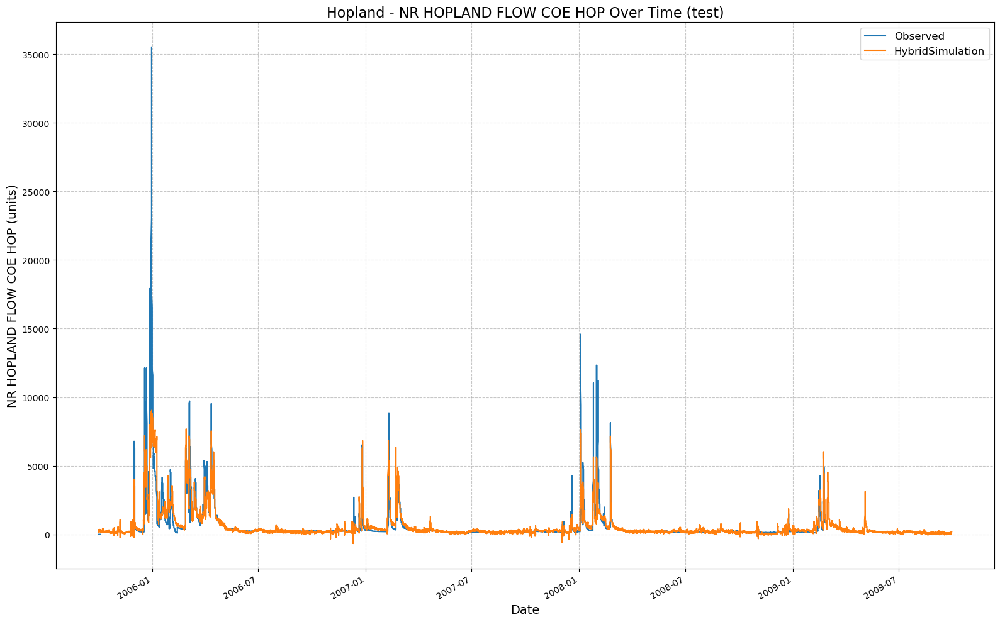


[Physics Test] NSE @1D = 0.6570271849632263
[Physics Test] NSE @1H = 0.6794140338897705


In [25]:
if not skip_best_model_test:
    print("\nTraining Physics MTS model for test period...")
    mtsPhysicsTest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data_1H,
        hourly=True,
        extend_train_period=True,
        gpu=GPU_SETTING,
        # num_ensemble_members=NUM_ENSEMBLES,
        is_mts = True
    )
    mtsPhysicsTest.train()
    physics_test_csv_1D, physics_test_metrics_1D = mtsPhysicsTest.results(period="test", mts_trk="1D")
    physics_test_csv_1H, physics_test_metrics_1H = mtsPhysicsTest.results(period="test", mts_trk="1H")
    print("\n[Physics Test] NSE @1D =", physics_test_metrics_1D.get("NSE", None))
    print("[Physics Test] NSE @1H =", physics_test_metrics_1H.get("NSE", None))


Plotting combined MTS2 results (Test, 1D)...


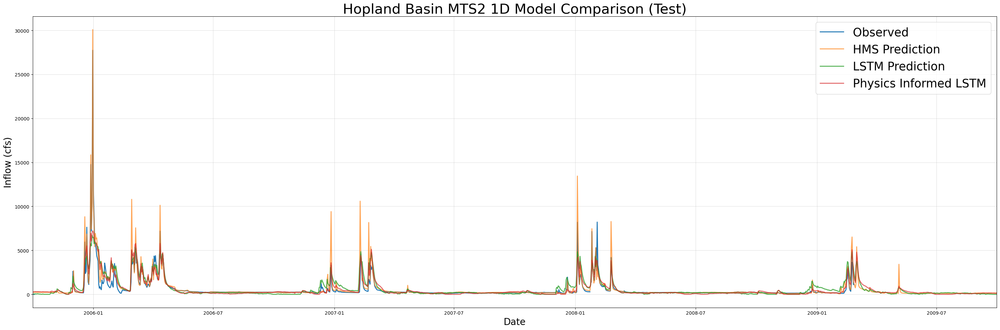

In [26]:
if not skip_best_model_test:
    print("\nPlotting combined MTS2 results (Test, 1D)...")
    combinedPlot(
        lstm_results=no_physics_test_csv_1D,
        lstmPhysics_results=physics_test_csv_1D,
        HMS_results=path_to_physics_data_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1D.csv",
        plot_filename="hopland_mts2_test_1D_comparison.png",
        timeseries_filename="hopland_mts2_test_1D_combined_ts.csv"
    )
else:
    combined_df_test_1D = pd.read_csv("hopland_mts2_test_1D_combined_ts.csv")
    combinedPlotFromDf(
        combined_df_test_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1D.csv"
    )

In [27]:
if not skip_best_model_test:
    fancyCombinedPlot(
        lstm_results=no_physics_test_csv_1D,
        lstmPhysics_results=physics_test_csv_1D,
        HMS_results=path_to_physics_data_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1D.csv",
        timeseries_filename="hopland_mts2_test_1D_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(
        combined_df_test_1D,
        title="Hopland Basin MTS2 1D Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1D.csv"
    )


Plotting combined MTS2 results (Test, 1H)...


c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:98: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21) have mixed types. Specify dtype option on import or set low_memory=False.



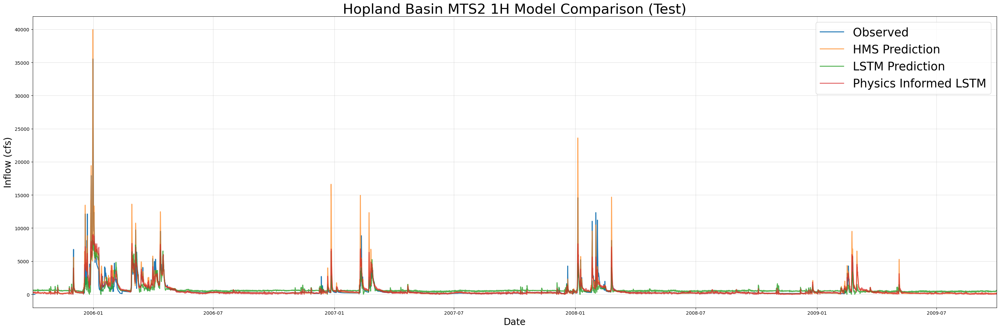

In [28]:
if not skip_best_model_test:
    print("\nPlotting combined MTS2 results (Test, 1H)...")
    combinedPlot(
        lstm_results=no_physics_test_csv_1H,
        lstmPhysics_results=physics_test_csv_1H,
        HMS_results=path_to_physics_data_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1H.csv",
        plot_filename="hopland_mts2_test_1H_comparison.png",
        timeseries_filename="hopland_mts2_test_1H_combined_ts.csv"
    )
else:
    combined_df_test_1H = pd.read_csv("hopland_mts2_test_1H_combined_ts.csv")
    combinedPlotFromDf(
        combined_df_test_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1H.csv"
    )

In [29]:
if not skip_best_model_test:
    fancyCombinedPlot(
        lstm_results=no_physics_test_csv_1H,
        lstmPhysics_results=physics_test_csv_1H,
        HMS_results=path_to_physics_data_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1H.csv",
        timeseries_filename="hopland_mts2_test_1H_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(
        combined_df_test_1H,
        title="Hopland Basin MTS2 1H Model Comparison (Test)",
        fName="hopland_mts2_test_metrics_1H.csv"
    )

c:\Users\arman\Dropbox\The University\Projects\UCB-USACE-LSTMs\UCB_training\models\hopland_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:201: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21) have mixed types. Specify dtype option on import or set low_memory=False.



In [30]:
# if skip_best_model_train:
test_metrics = pd.read_csv("hopland_mts2_test_metrics_1D.csv")
print(test_metrics)

     Unnamed: 0            HMS           LSTM  Physics_Informed_LSTM
0           NSE       0.794497       0.574017               0.657622
1           MSE  408094.845610  845930.253340          679905.688681
2          RMSE     638.823016     919.744667             824.563939
3           KGE       0.727840       0.647984               0.724435
4     Alpha-NSE       1.186924       0.819602               0.805891
5      Beta-KGE       1.185327       1.188902               1.051324
6      Beta-NSE       0.079795       0.081334               0.022098
7     Pearson-r       0.930832       0.764017               0.811258
8           FHV      23.955100     -29.946997             -24.966028
9           FMS      31.744872     127.855298             102.015552
10          FLV      96.362760      25.412767              24.874143
11  Peak-Timing       0.200000       0.800000               0.600000
12    Peak-MAPE      37.534168      40.567030              37.978862
13        PBIAS     -18.532697    

In [31]:
# if skip_best_model_train:
test_metrics = pd.read_csv("hopland_mts2_test_metrics_1H.csv")
print(test_metrics)

     Unnamed: 0            HMS          LSTM  Physics_Informed_LSTM
0           NSE       0.751830  5.401727e-01               0.679500
1           MSE  549210.378443  1.017616e+06          709278.618295
2          RMSE     741.087295  1.008770e+03             842.186807
3           KGE       0.711821  4.559395e-01               0.713758
4     Alpha-NSE       1.204128  5.768831e-01               0.782984
5      Beta-KGE       1.185550  1.249029e+00               1.067264
6      Beta-NSE       0.075689  1.015826e-01               0.027438
7     Pearson-r       0.916631  7.655675e-01               0.825890
8           FHV      22.679614 -2.997939e+01             -18.747586
9           FMS      26.515350 -7.354247e+01              47.345506
10          FLV      96.357821 -6.561413e+00               2.774644
11  Peak-Timing            NaN           NaN                    NaN
12    Peak-MAPE      40.299279  5.929592e+01              39.958156
13        PBIAS     -18.555029 -2.490288e+01    

In [32]:
# end time in UTC
end_time = datetime.utcnow()
print("End time:", end_time.strftime("%Y-%m-%d %H:%M:%S"))
print("Total time:", end_time - start_time)

End time: 2025-06-19 18:41:07
Total time: 0:01:20.027625


C:\Users\arman\AppData\Local\Temp\ipykernel_30528\3311245365.py:2: DeprecationWarning:

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).

